In [1]:
import sys
sys.path.append(r'../')
import os
os.chdir('../')
import sys
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.decomposition import PCA
import cebra.datasets
from functions import Database, preprocess_data, prep_data, plotting_neuronal_behavioural, plot_latent_timeseries
from plotting_functions import plot_phase_space, plot_ps_
from bundlenet import BunDLeNet, train_model
import seaborn as sns

%reload_ext autoreload
%autoreload 2

2024-02-12 11:52:39.643109: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-12 11:52:39.643130: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-12 11:52:39.643933: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-12 11:52:39.648531: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-12 11:52:40.423243: W tensorflow/compiler/tf2

In [1]:
from plotting_functions import plot_phase_space

## Load data

For the monkey dataset, use the following Google Drive link to download the folder, and save it in `data/` as `data/monkey_reaching_preload_smth_40/active_all.jl`:

https://drive.google.com/drive/folders/1XWEyTyfgYnz5UQCmnU9gRRuFBwRtyrWF?usp=sharing


In [4]:
monkey_pos = cebra.datasets.init('area2-bump-pos-active')
monkey_target = cebra.datasets.init('area2-bump-target-active')
### exploring data
X = monkey_pos.neural.numpy()
B = monkey_pos.continuous_index.numpy()
X.shape, B.shape

((115800, 65), (115800, 2))

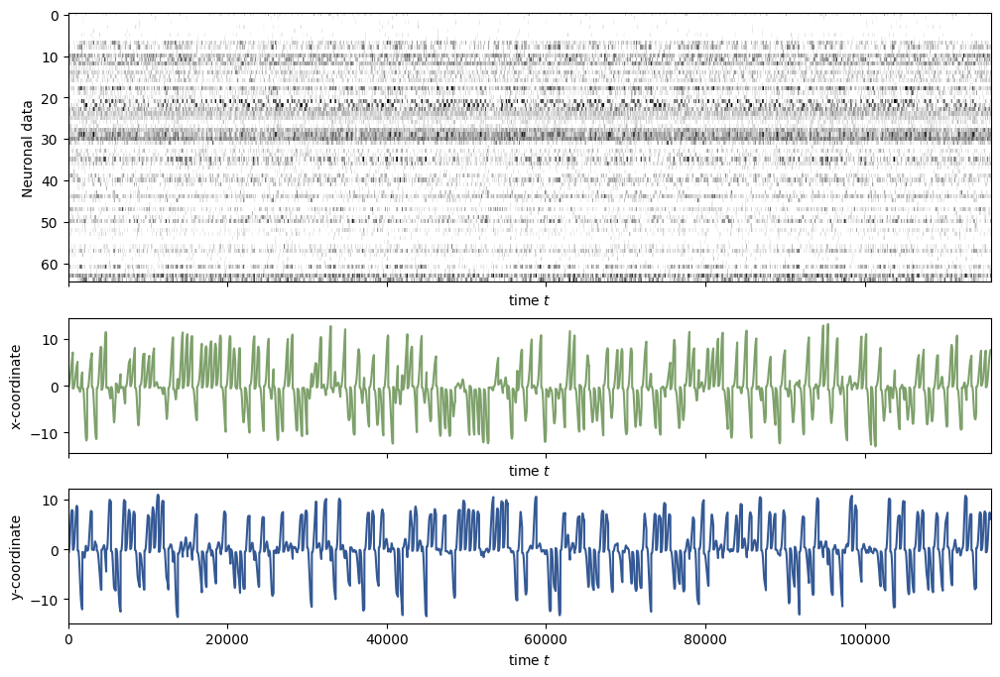

In [5]:
def plotting_neuronal_behavioural(X,B, state_names=[], vmin=0, vmax=.1):
    fig, axs = plt.subplots(3,1,figsize=(12,8),  sharex=True, gridspec_kw={'height_ratios': [2, 1, 1]})
    im0 = axs[0].imshow(X.T,aspect='auto', vmin=vmin,vmax=vmax, interpolation='None', cmap='binary')
    # tell the colorbar to tick at integers
    axs[0].set_xlabel("time $t$")
    axs[0].set_ylabel("Neuronal data")
    
    colors = ['#7EA16B', '#345995', '#AF125A']
    ylabels = ['x-coordinate', 'y-coordinate']
    for i in range(2):
        # Behaviour 1
        im1 = axs[i+1].plot(B[:,i], c=colors[i])
        axs[i+1].set_xlabel("time $t$")
        axs[i+1].set_ylabel(ylabels[i])
        #axs[i+1].set_yticks([])

    plt.savefig('figures/monkey_data.pdf')
    plt.show()
    
plotting_neuronal_behavioural(X,B)

## BunDLe-Net

In [6]:
X_, B_ = prep_data(X, B, win=20)

### Deploy BunDLe Net
model = BunDLeNet(latent_dim=3, num_behaviour=B_.shape[1])
model.build(input_shape=X_.shape)
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)

#X_train, X_test, B_train, B_test = timeseries_train_test_split(X_, B_)
loss_array = train_model(X_,
                         B_, 
                         model,
                         optimizer, 
                         gamma=0.9, 
                         n_epochs=200,
                         pca_init=False,
                         best_of_5_init=True
                                     )

2024-02-12 11:52:47.233337: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2408224000 exceeds 10% of free system memory.
2024-02-12 11:52:48.792088: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2408224000 exceeds 10% of free system memory.
Losses 0.004879 0.310654 0.315533: 100%|████████| 20/20 [00:48<00:00,  2.43s/it]
2024-02-12 11:53:38.843962: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2408224000 exceeds 10% of free system memory.
Losses 0.005037 1.196404 1.201441: 100%|████████| 20/20 [00:43<00:00,  2.16s/it]


model: 0 loss: 0.24113092202144726
model: 1 loss: 0.24592884146529595
model: 2 loss: 0.449967059629305
model: 3 loss: 2.3485400590338683
model: 4 loss: 0.3535704164028277


Losses 0.005693 0.258540 0.264233: 100%|██████| 200/200 [07:33<00:00,  2.27s/it]


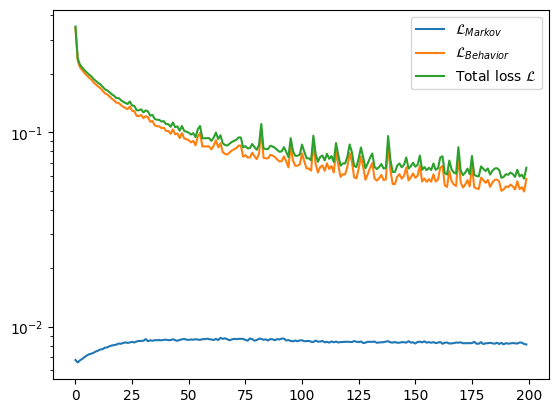

In [7]:
# Training losses vs epochs
plt.figure()
for i, label in  enumerate(["$\mathcal{L}_{{Markov}}$", "$\mathcal{L}_{{Behavior}}$","Total loss $\mathcal{L}$" ]):
	plt.semilogy(loss_array[:,i], label=label)
plt.legend()
plt.show()

## Projecting into latent space

In [8]:
Y0_BunDLeNet = model.tau(X_[:,0]).numpy() 

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_BunDLeNet_monkey', Y0_BunDLeNet)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_BunDLeNet_monkey', B_)

## Visualising embedding

<IPython.core.display.Javascript object>


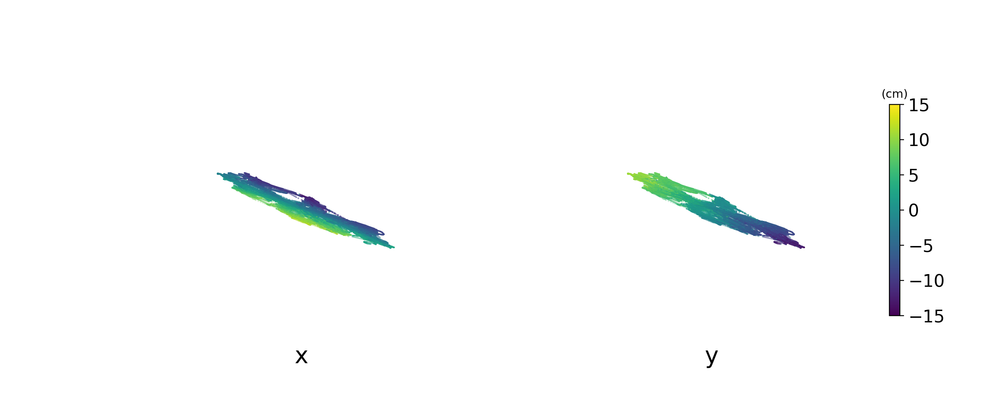

In [9]:
%matplotlib notebook
def plot_embedding(Y0_, B_, title=None, **kwargs):
    elev, azim, roll = 27,10,0
    fig = plt.figure(figsize=(12, 5))
    plt.suptitle(title,
                 fontsize=20)
    ax = plt.subplot(121, projection = '3d')
    ax.view_init(**kwargs)
    ax.set_title('x', fontsize=20, y=0)
    x = ax.scatter(Y0_[:, 0],
                   Y0_[:, 1],
                   Y0_[:, 2],
                   c=B_[:, 0],
                   cmap='viridis',
                   s=0.1,
                   vmin=-15,
                   vmax=15)
    ax.axis('off')
    ax = plt.subplot(122, projection = '3d')
    ax.view_init(**kwargs)
    y = ax.scatter(Y0_[:, 0],
                   Y0_[:, 1],
                   Y0_[:, 2],
                   c=B_[:, 1],
                   cmap='viridis',
                   s=0.1,
                   vmin=-15,
                   vmax=15)
    ax.axis('off')
    ax.set_title('y', fontsize=20, y=0)
    yc = plt.colorbar(y, fraction=0.03, pad=0.05, ticks=np.linspace(-15, 15, 7))
    yc.ax.tick_params(labelsize=15)
    yc.ax.set_title("(cm)", fontsize=10)
    plt.show()

plot_embedding(Y0_BunDLeNet, B_, elev=27, azim=10)

# Comparision with other embedding algorithms

## PCA

In [10]:
dim = 3
pca = PCA(n_components=dim)
pca.fit(X_[:,0,0,:]) ###################### use X instead of X_
print('Percentage of variance explained by the first ', dim, ' PCs: ', pca.explained_variance_ratio_[:dim].sum().round(3))

### Projecting into latent space
Y0_pca = pca.transform(X_[:,0,0,:])

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_pca_monkey', Y0_pca)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_pca_monkey', B_)

Percentage of variance explained by the first  3  PCs:  0.412


<IPython.core.display.Javascript object>


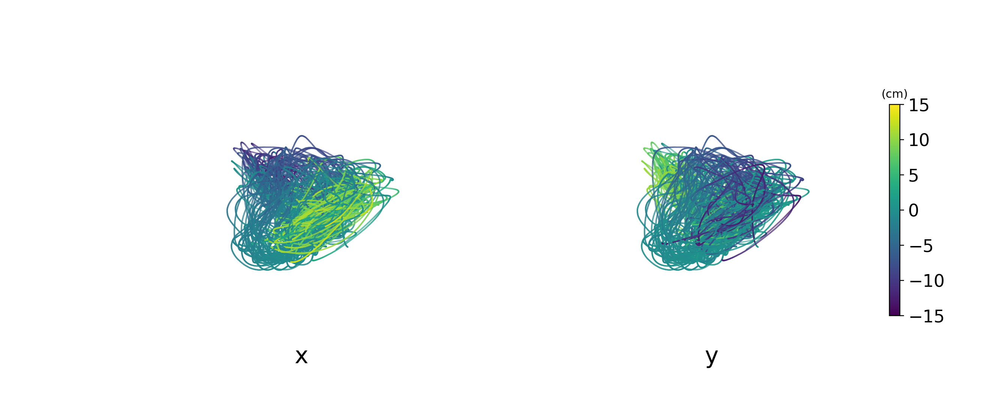

In [11]:
plot_embedding(Y0_pca, B_, elev=27, azim=10)

# t-SNE


In [12]:
from sklearn.manifold import TSNE

### Deploy tsne
dim = 3
tsne = TSNE(n_components=dim, init='pca', perplexity=80)

### Projecting into latent space
Y0_tsne = tsne.fit_transform(X_[:,0,0,:])

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_tsne_monkey', Y0_tsne)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_tsne_monkey', B_)

<IPython.core.display.Javascript object>


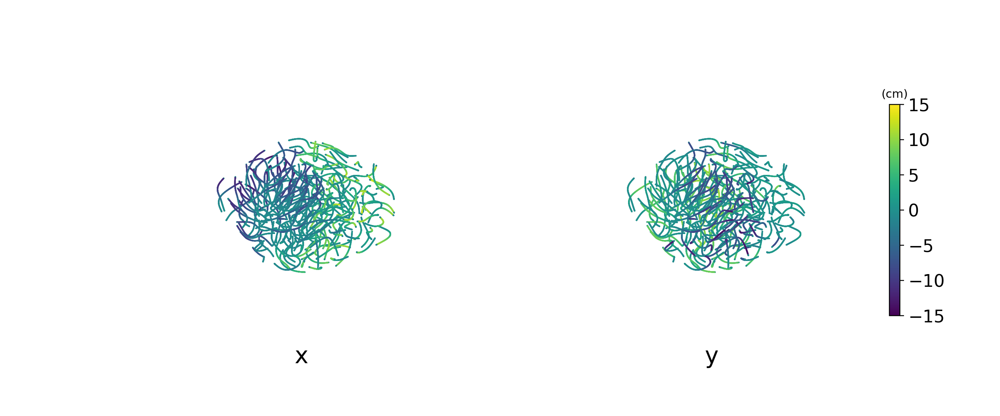

In [13]:
plot_embedding(Y0_tsne, B_, elev=27, azim=10)

## CEBRA-Hybrid

In [14]:
from cebra import CEBRA
cebra_hybrid_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=3,
                        max_iterations=500,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10,
                        hybrid = True)

In [15]:
cebra_hybrid_model.fit(X, B)
Y0_cebra = cebra_hybrid_model.transform(X)

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_cebra_monkey', Y0_cebra)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_cebra_monkey', B)

behavior_pos: -0.7763 behavior_neg:  6.4101 behavior_total:  5.6338 time_pos: -0


<IPython.core.display.Javascript object>


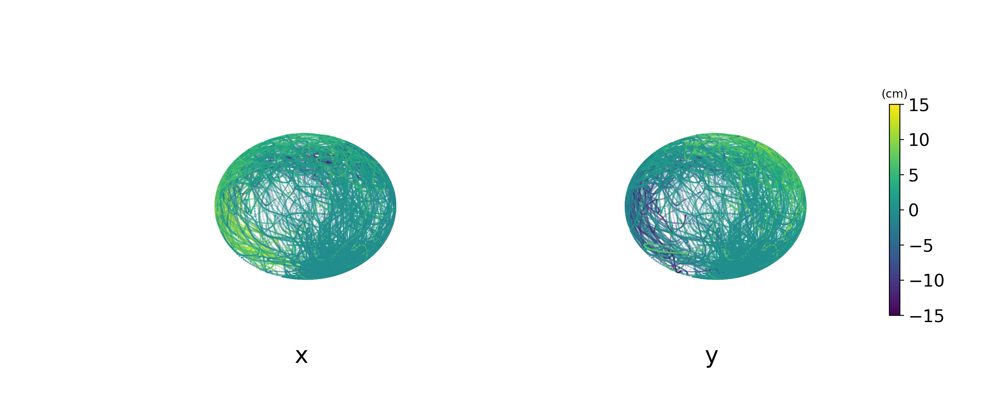

In [16]:
plot_embedding(Y0_cebra, B, elev=27, azim=10)

## Autoencoder

In [17]:
from autoencoder import Autoencoder

### Prepare data
X_, B_ = prep_data(X, B, win=1)
X0_ = X_[:,0,:,:]

### Deploy Autoencoder
autoencoder = Autoencoder(latent_dim = 3, ninput_shape=X0_.shape)
opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)
autoencoder.compile(optimizer=opt, loss='mse', metrics=['mse'])

history = autoencoder.fit(
                        X0_,
                        X0_,
                        epochs=150,
                        batch_size=100,
                        verbose=False
                        )

X0_pred = autoencoder(X0_).numpy()

### Projecting into latent space
Y0_autoenc = autoencoder.encoder(X0_).numpy()

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_autoenc_monkey', Y0_autoenc)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_autoenc_monkey', B_)

<IPython.core.display.Javascript object>


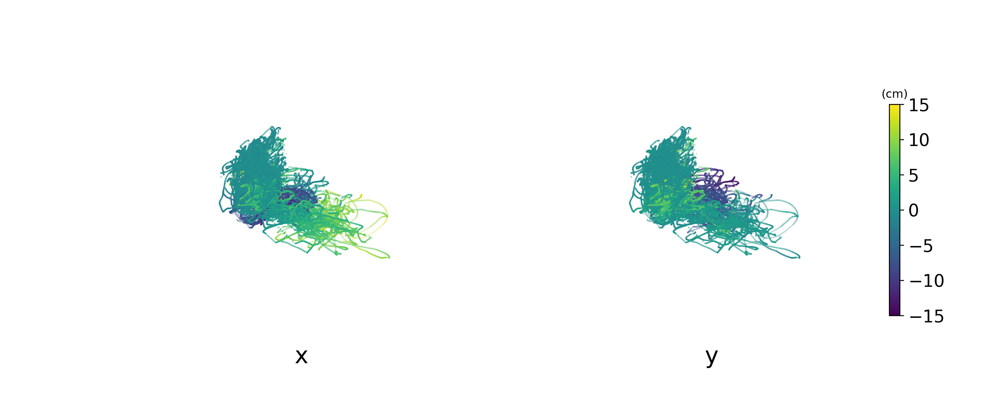

In [18]:
plot_embedding(Y0_autoenc, B_, elev=27, azim=10)

## Autoregressor-autoencoder (ArAe)

In [19]:
from autoencoder import Autoencoder

X_, B_ = prep_data(X, B, win=1)
X0_ = X_[:,0,:,:]
X1_ = X_[:,1,:,:]
Xdiff_ = X1_ - X0_

### Scaling input and output data
Xdmax = (np.abs(Xdiff_)).max() # Parameters for scaling
Xdiff_= Xdiff_/Xdmax

In [20]:
### Deploy ArAe
ArAe = Autoencoder(latent_dim = 3, ninput_shape=X0_.shape)
opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)
ArAe.compile(optimizer=opt, loss='mse', metrics=['mse'])
history = ArAe.fit(X0_,
                        Xdiff_,
                        epochs=50,
                        batch_size=100,
                        verbose=False,
                        )

### Projecting into latent space
Y0_ArAe = ArAe.encoder(X0_).numpy()

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_ArAe_monkey', Y0_ArAe)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_ArAe_monkey', B_)

<IPython.core.display.Javascript object>


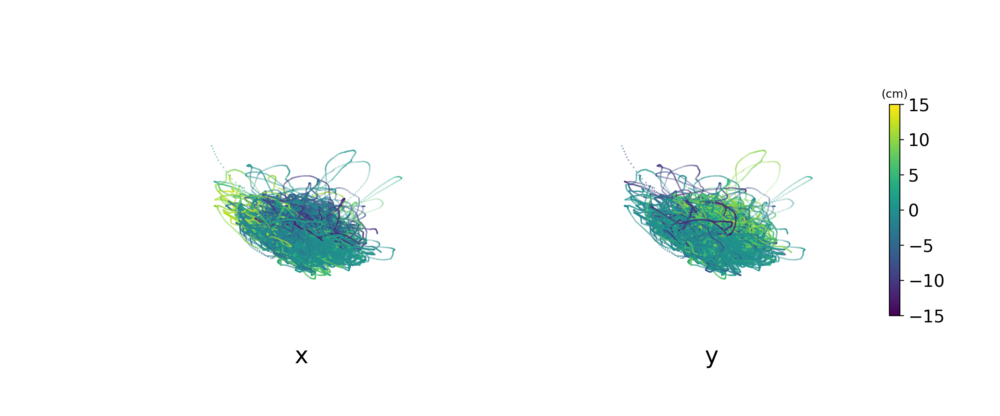

In [21]:
plot_embedding(Y0_ArAe, B_, elev=27, azim=10)

## Plotting everything to compare

<IPython.core.display.Javascript object>


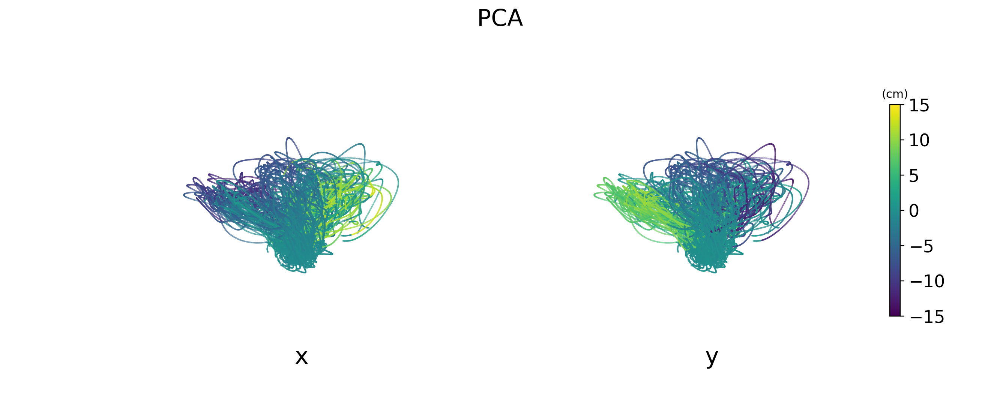

<IPython.core.display.Javascript object>


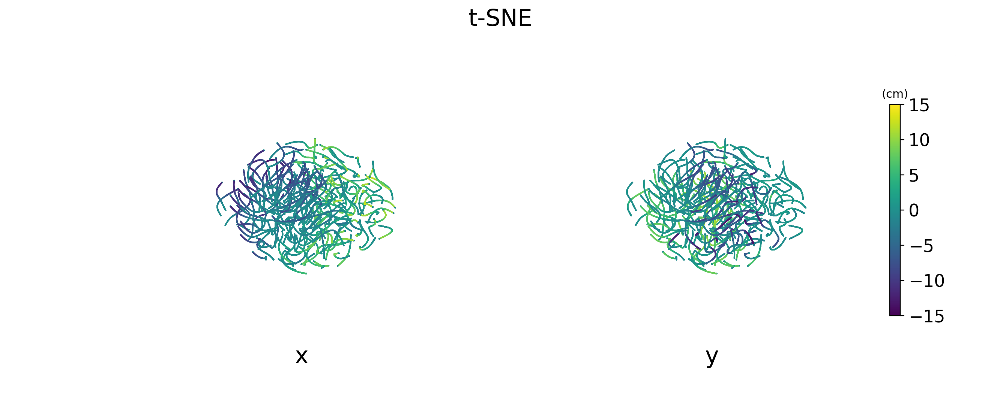

<IPython.core.display.Javascript object>


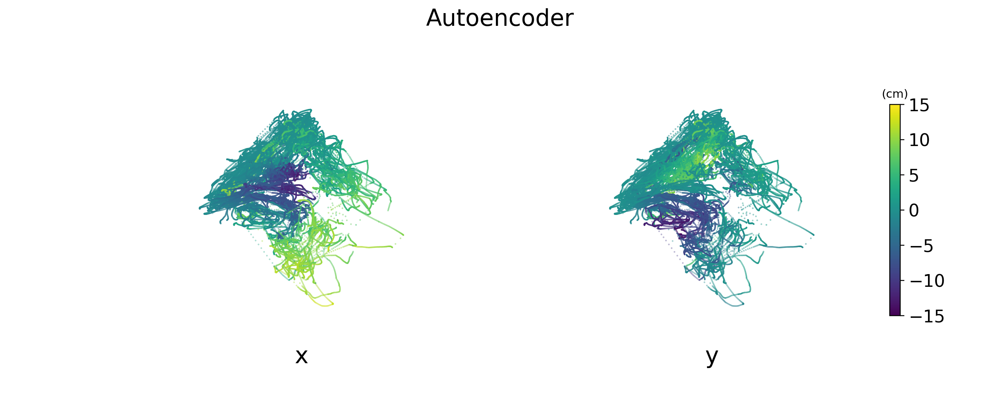

<IPython.core.display.Javascript object>


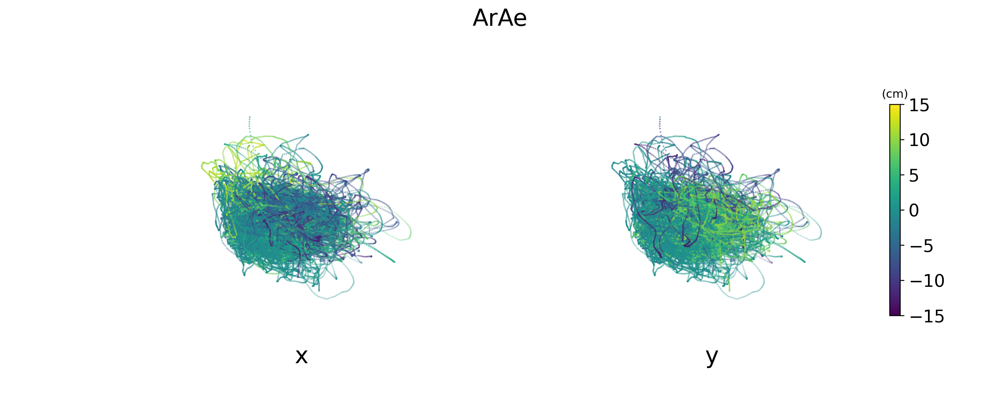

<IPython.core.display.Javascript object>


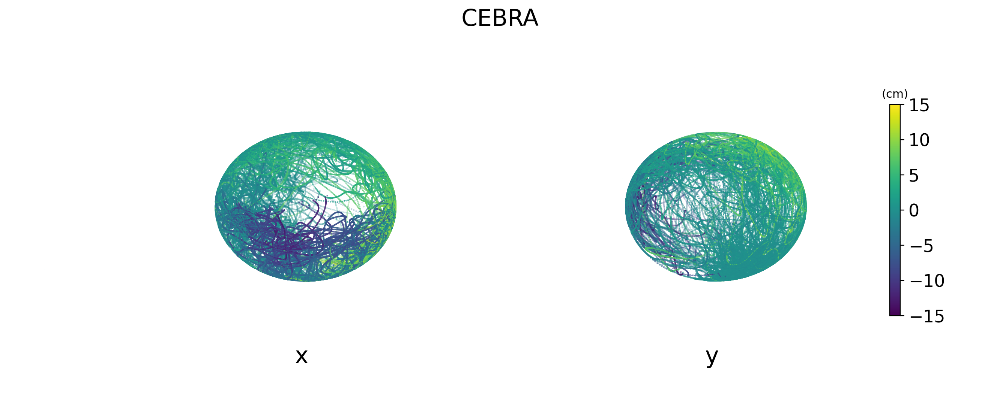

<IPython.core.display.Javascript object>


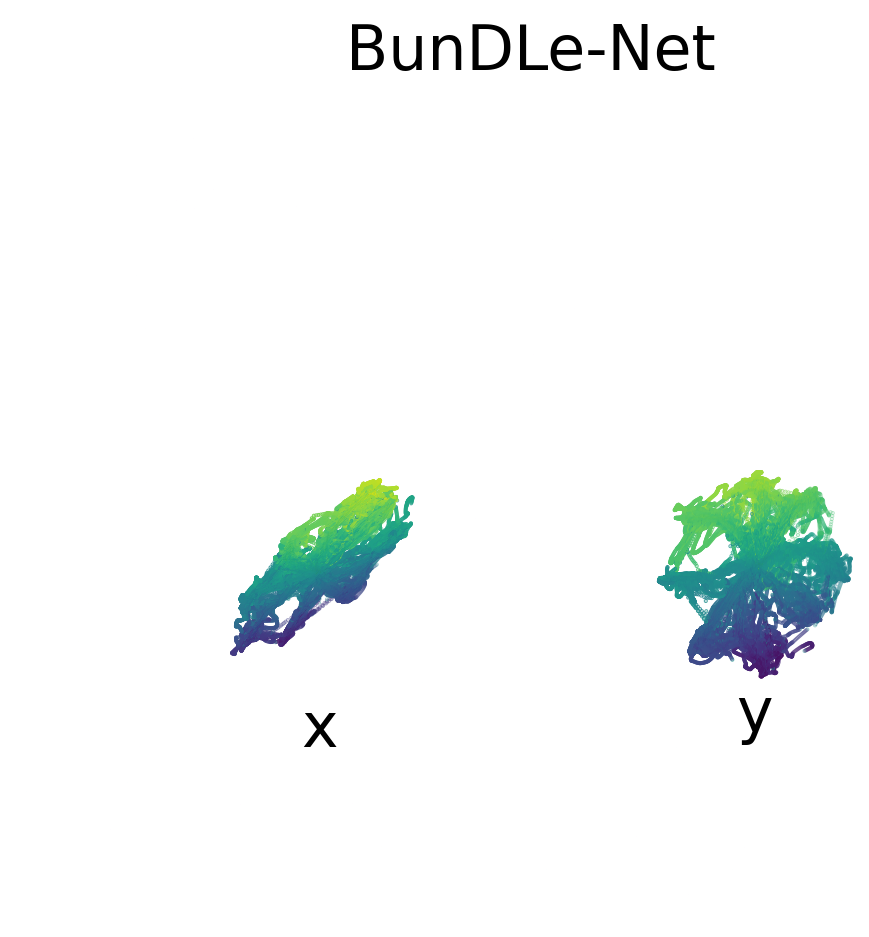

In [26]:
algs = ['pca', 'tsne', 'autoenc', 'ArAe', 'cebra', 'BunDLeNet']
titles = ['PCA', 't-SNE', 'Autoencoder', 'ArAe', 'CEBRA', 'BunDLe-Net']
elev = [6,19,-34,79,31,74]
azim = [-34,6,-26,66,9,89]
for i, (alg, title) in enumerate(zip(algs,titles)):
    Y0_= np.loadtxt('data/generated/saved_Y/comparison_algorithms/Y0_' + alg + '_monkey')
    B_ = np.loadtxt('data/generated/saved_Y/comparison_algorithms/B_' + alg + '_monkey')

    plot_embedding(Y0_, B_, title=titles[i], elev=elev[i], azim=azim[i])
    
plt.grid(False)
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


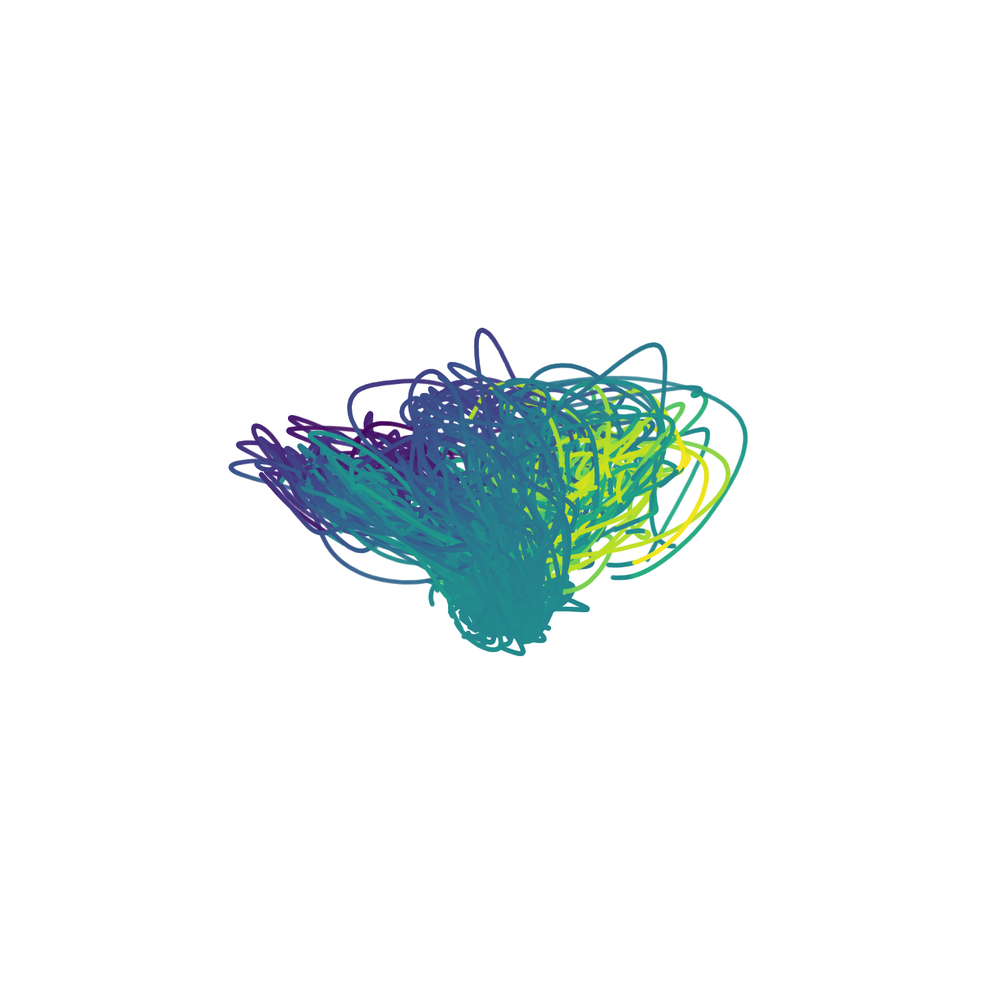

<IPython.core.display.Javascript object>


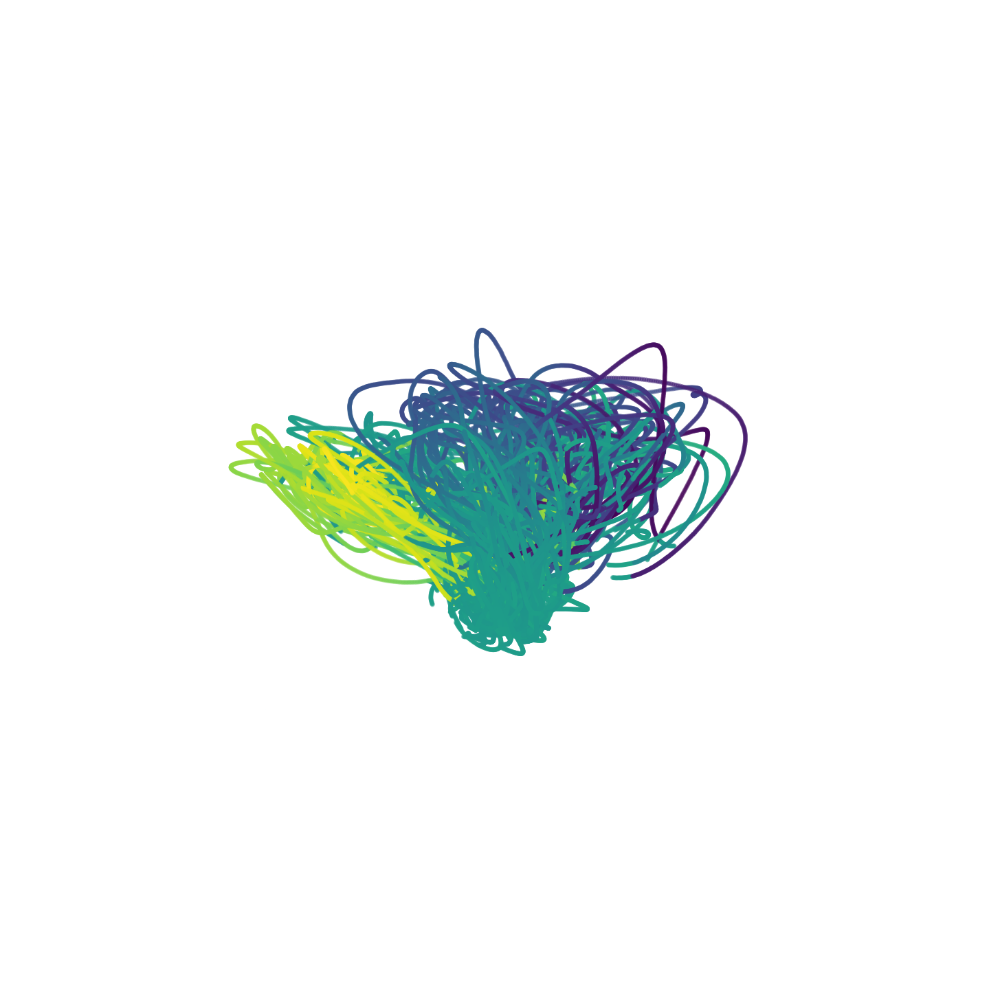

<IPython.core.display.Javascript object>


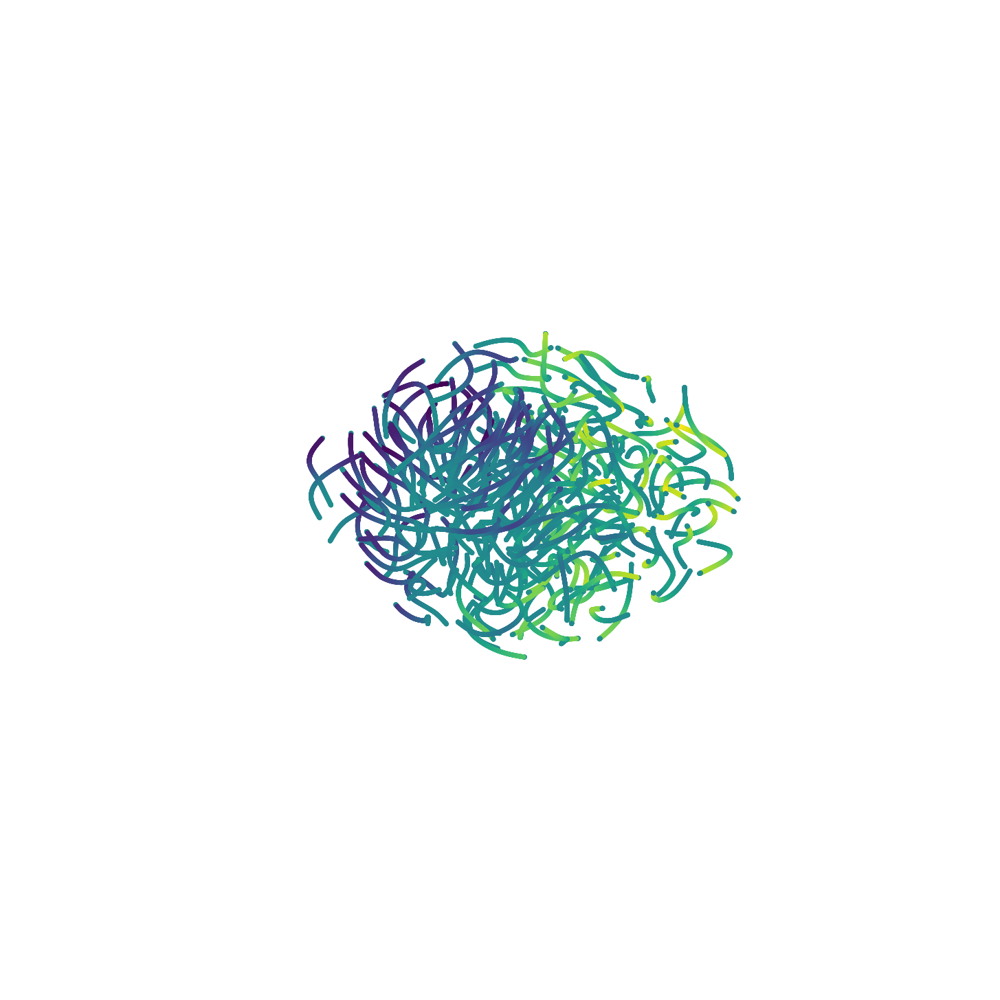

<IPython.core.display.Javascript object>


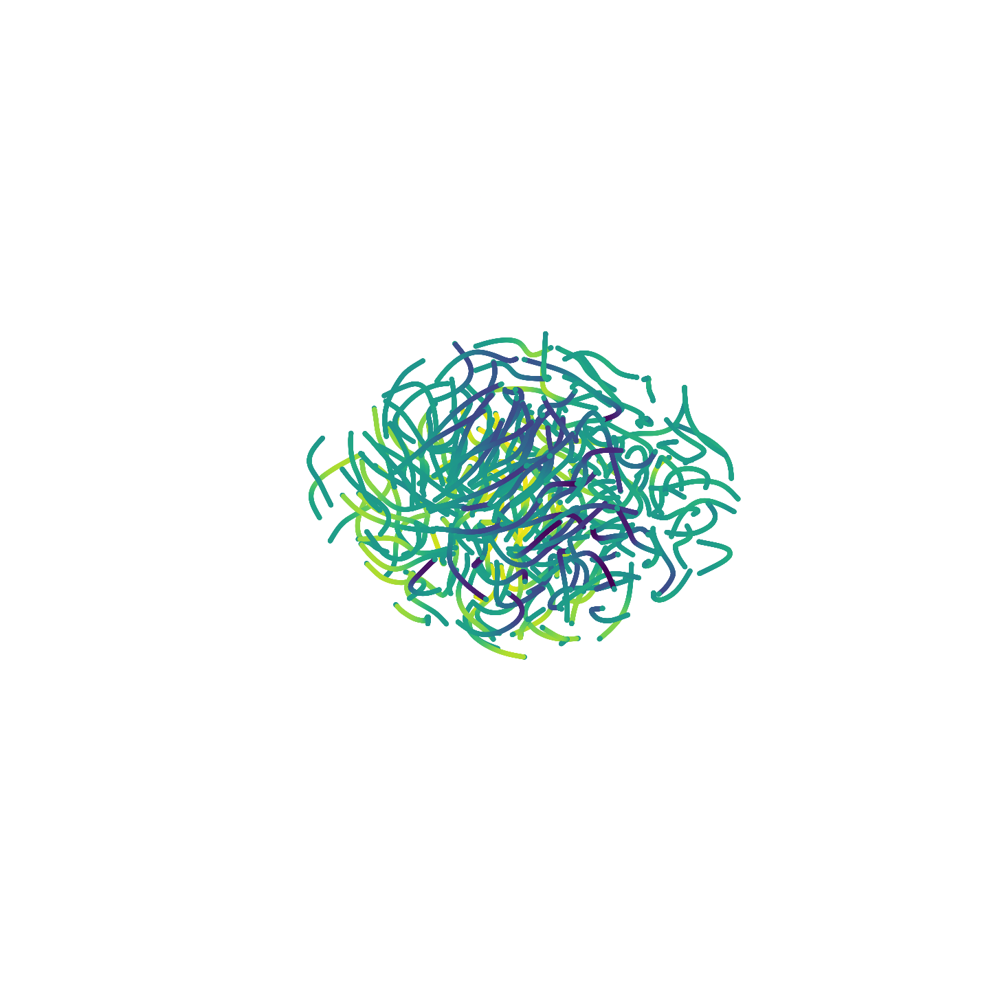

<IPython.core.display.Javascript object>


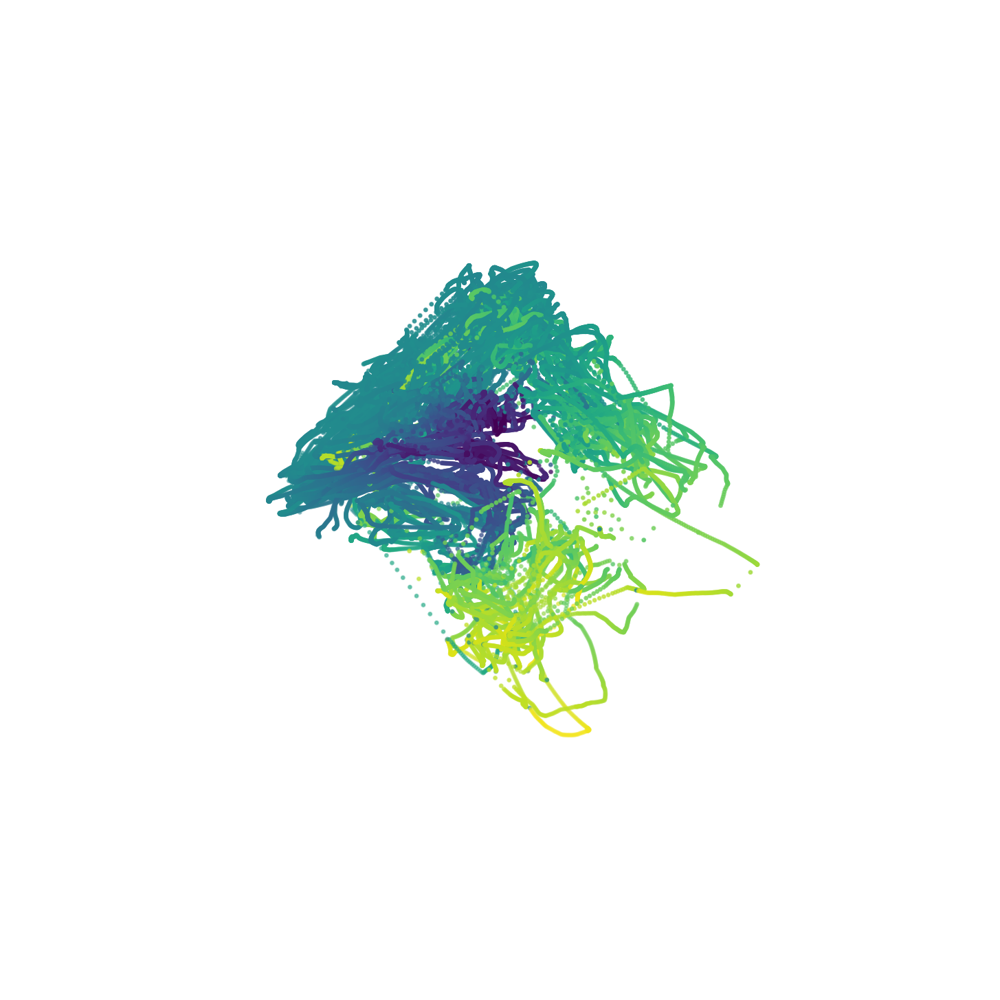

<IPython.core.display.Javascript object>


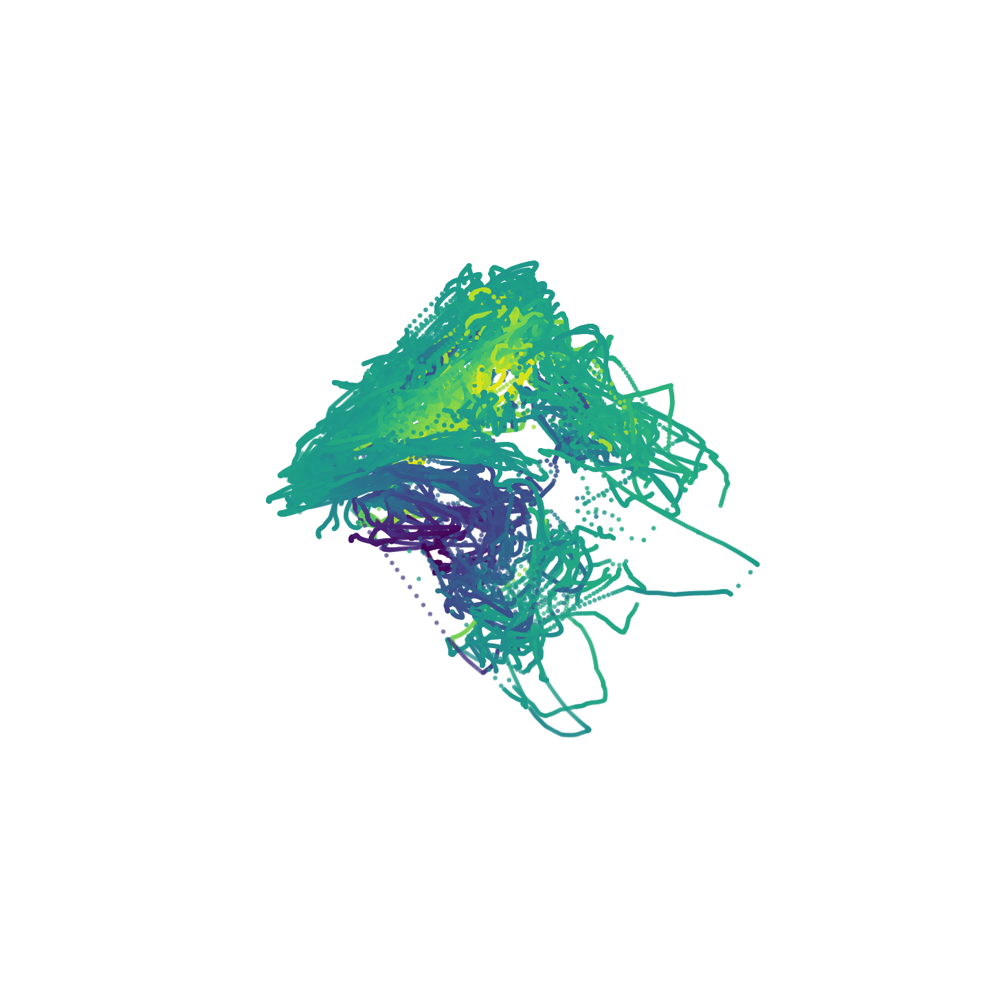

<IPython.core.display.Javascript object>


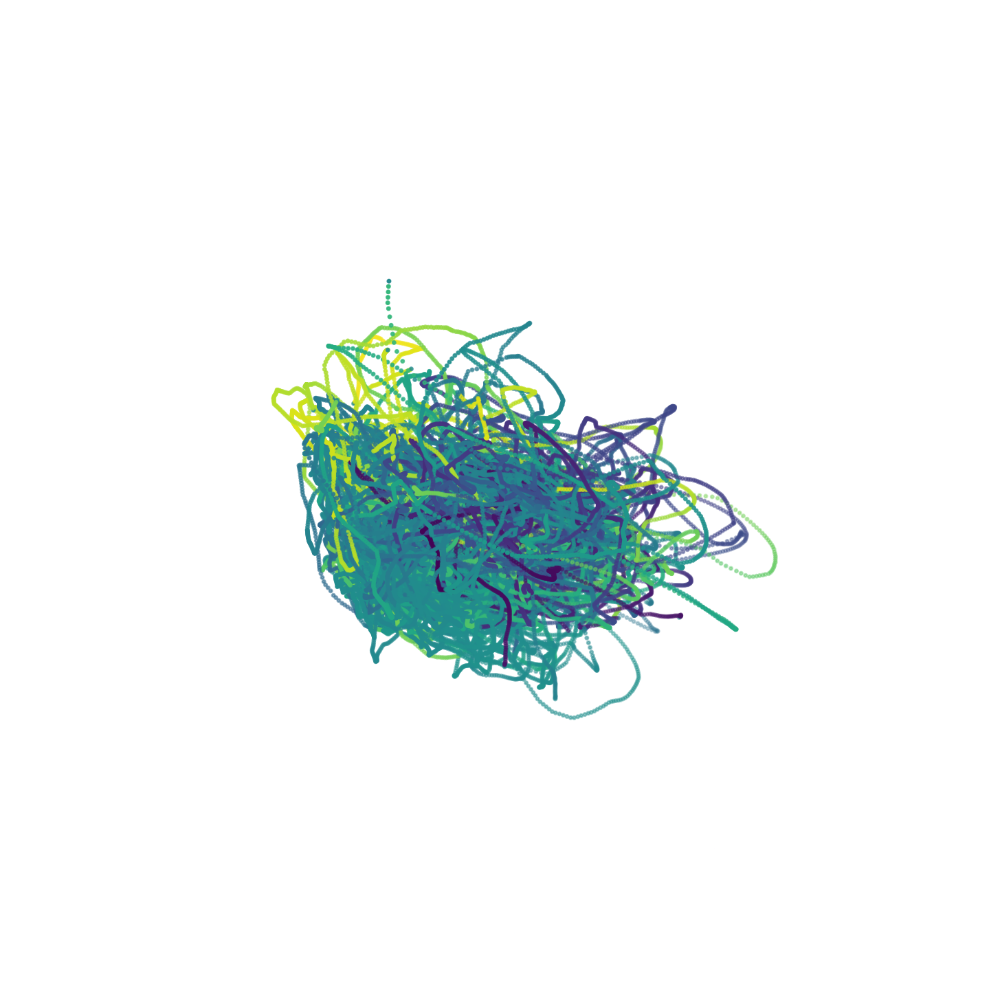

<IPython.core.display.Javascript object>


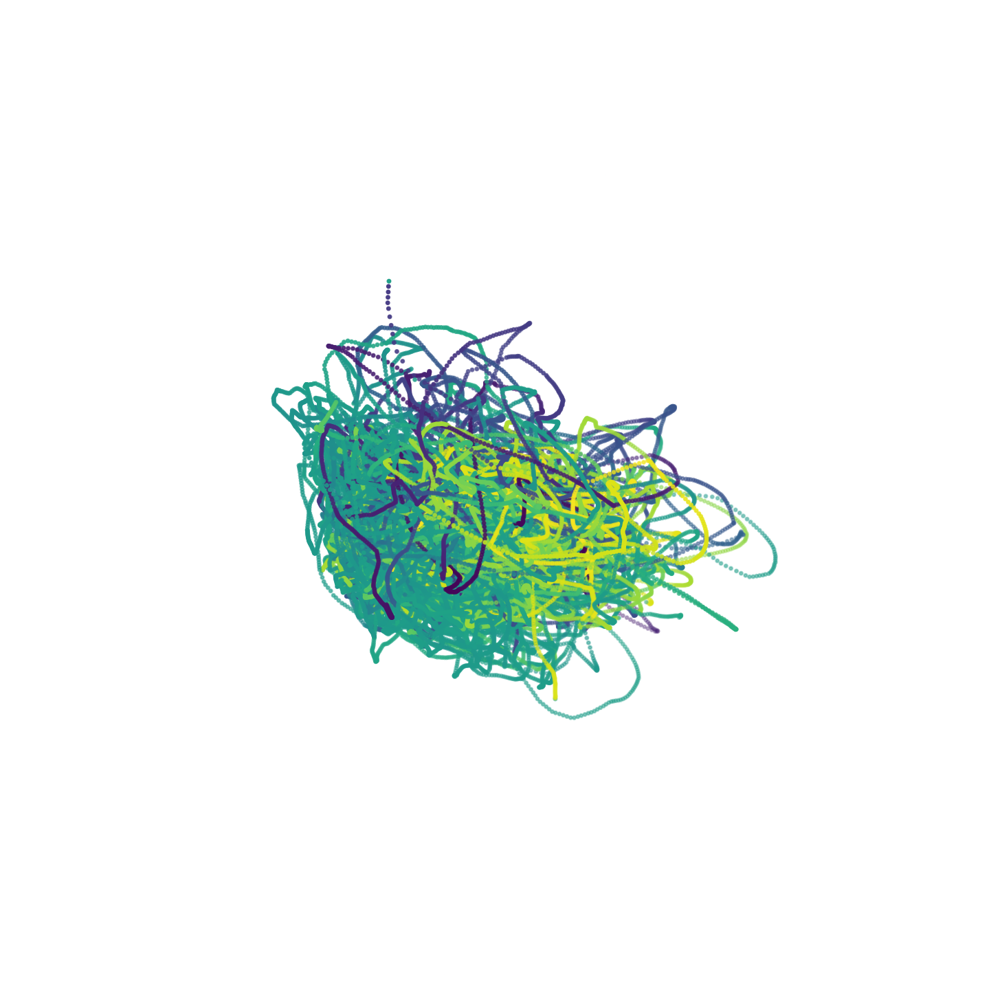

/tmp/ipykernel_317862/2644869009.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


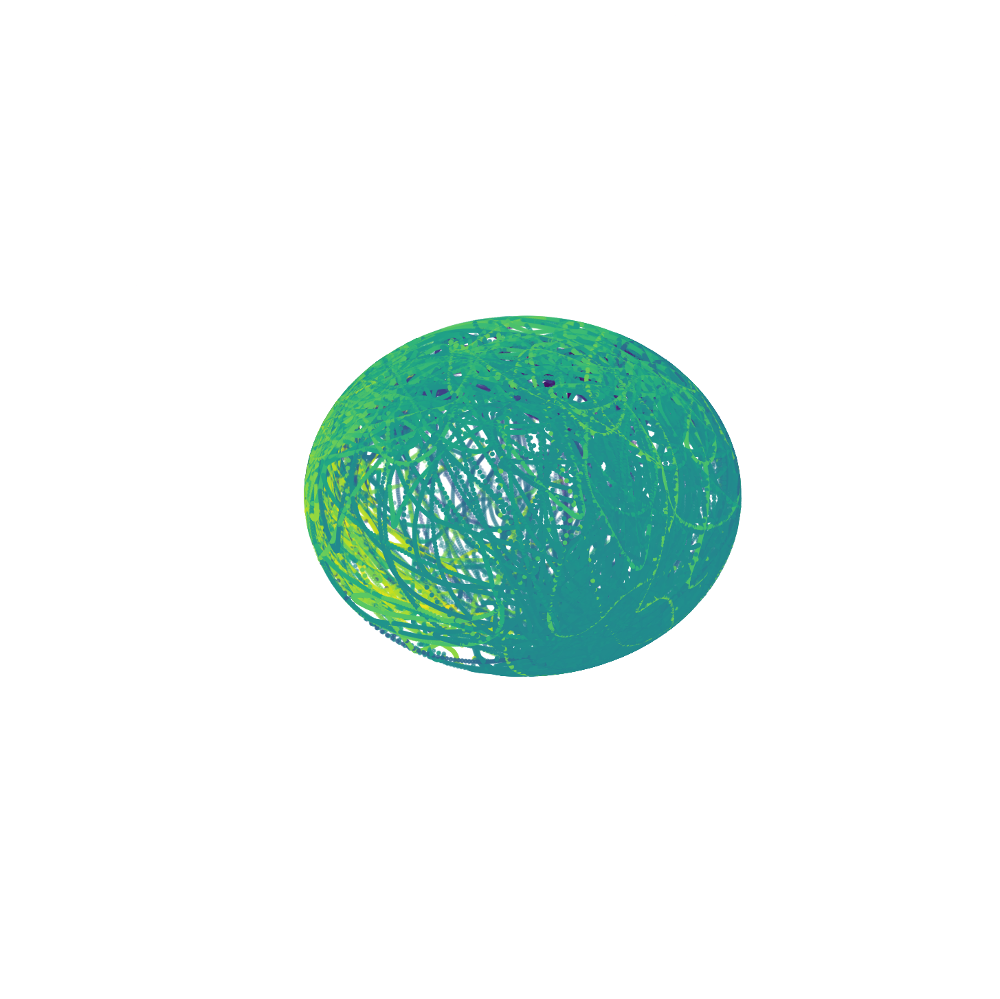

<IPython.core.display.Javascript object>


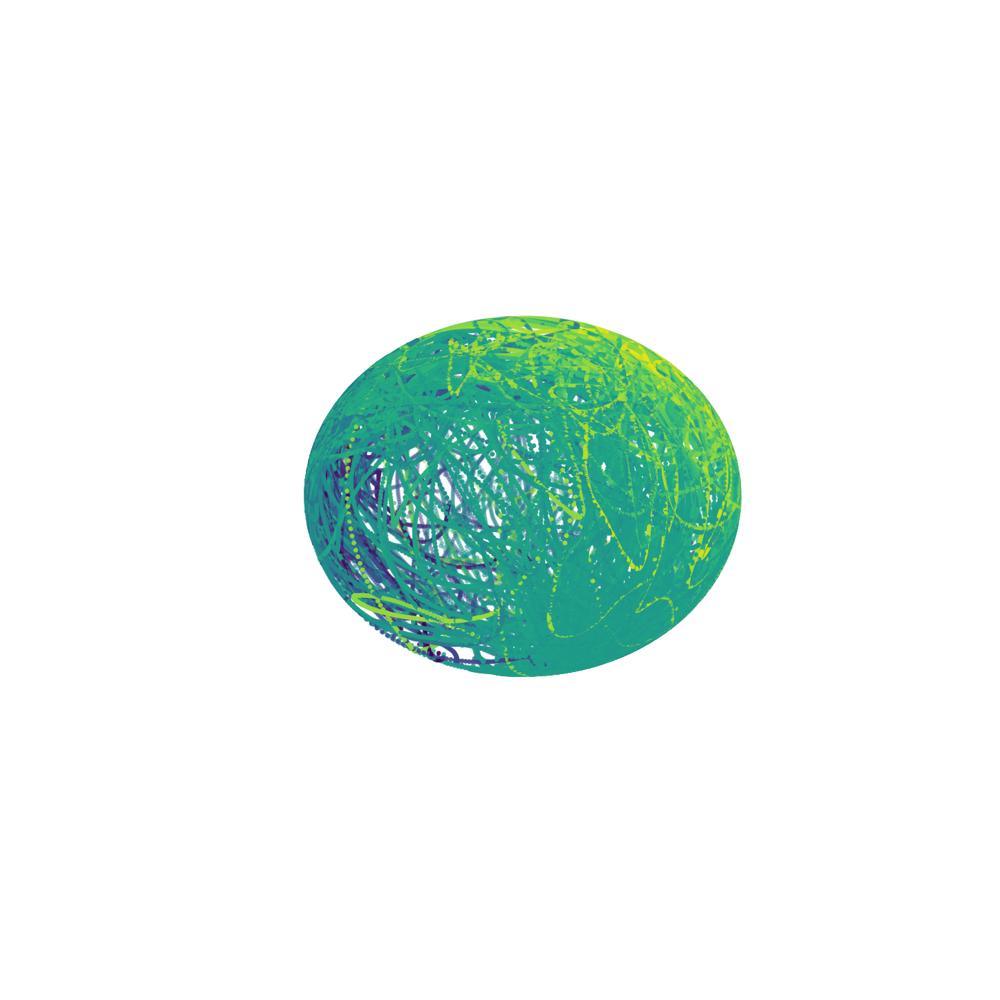

<IPython.core.display.Javascript object>


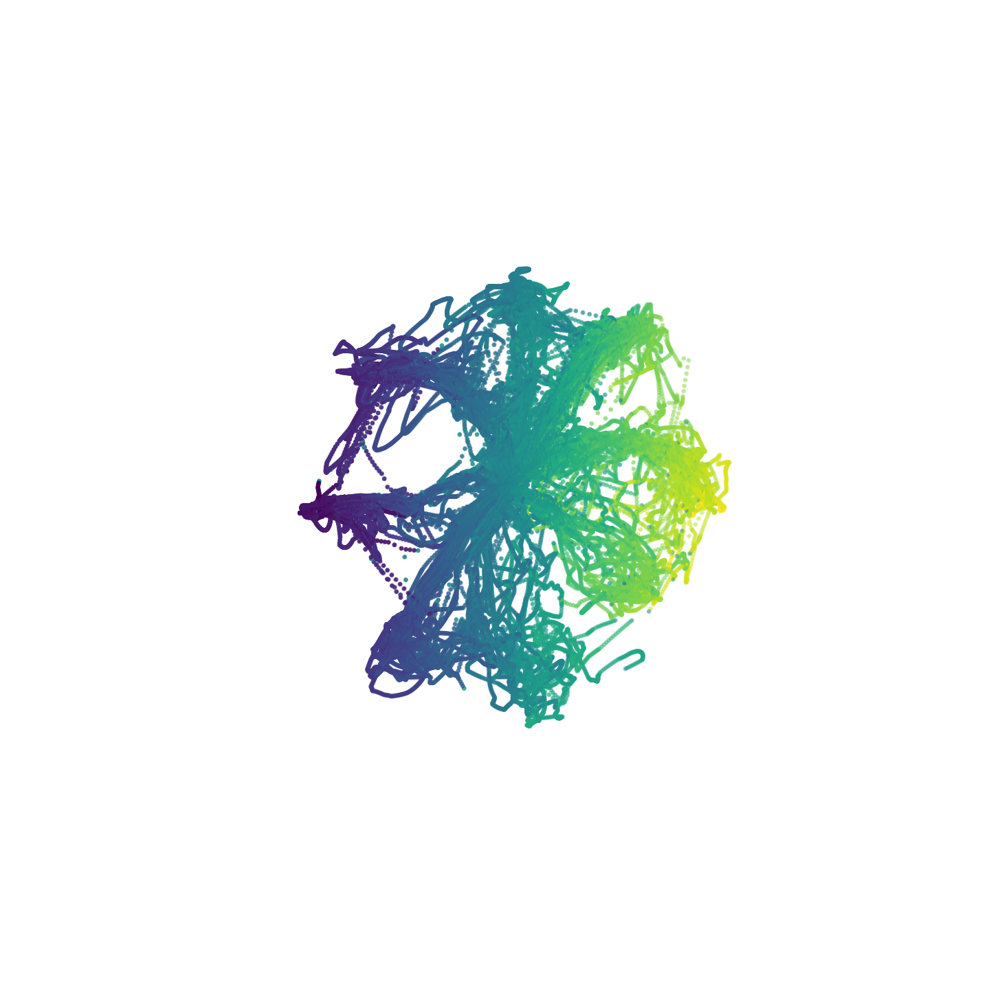

<IPython.core.display.Javascript object>


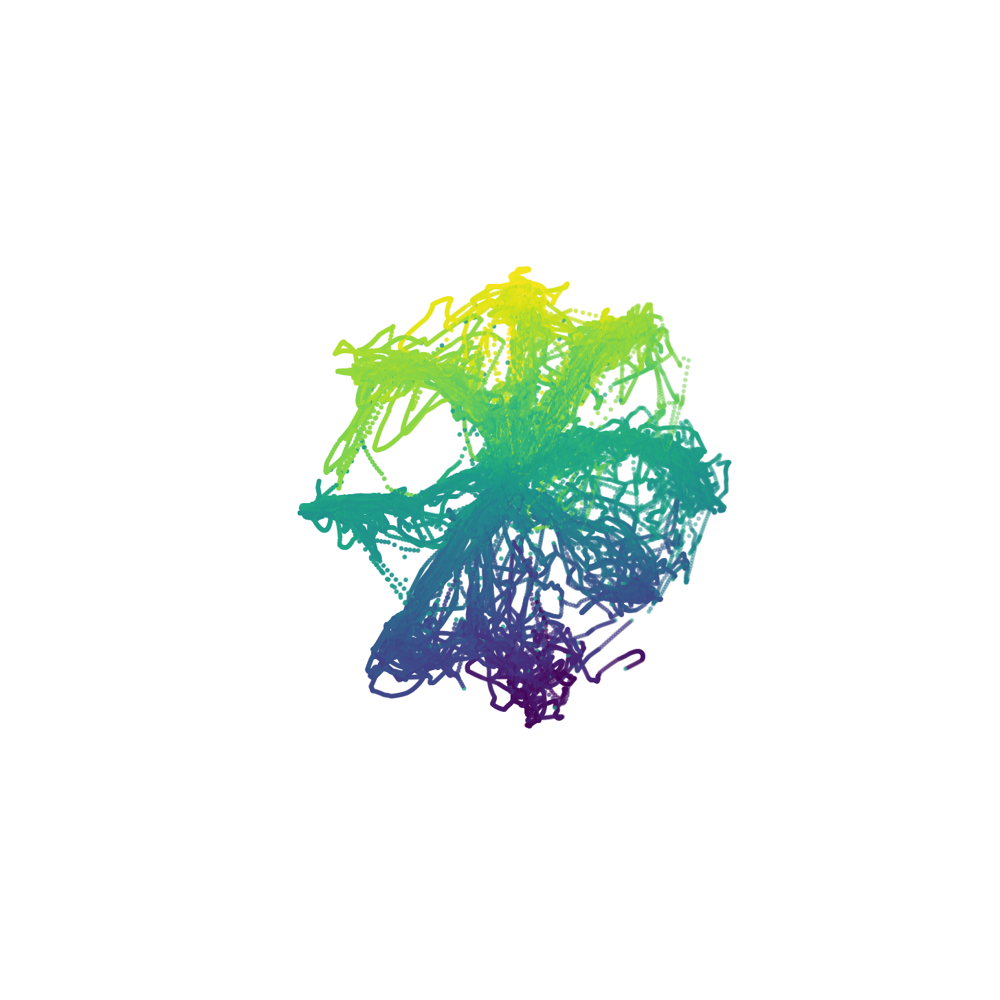

In [27]:
# Code to save figures for paper
elev = [6,19,-34,79,31,74]
azim = [-34,6,-26,66,9,89]

algs = ['pca', 'tsne', 'autoenc', 'ArAe', 'cebra', 'BunDLeNet']
titles = ['PCA', 't-SNE', 'Autoencoder', 'ArAe', 'CEBRA', 'BunDLe-Net']
for i, (alg, title) in enumerate(zip(algs,titles)):
    
    Y0_= np.loadtxt('data/generated/saved_Y/comparison_algorithms/Y0_' + alg + '_monkey')
    B_ = np.loadtxt('data/generated/saved_Y/comparison_algorithms/B_' + alg + '_monkey')
    #1
    fig = plt.figure(figsize=(8, 8))
    ax = plt.axes(projection='3d')
    pcm = ax.scatter(Y0_[:, 0], Y0_[:, 1], Y0_[:, 2], c=B_[:,0], s=3)
    ax.grid(False)
    ax.axis('off')
    ax.view_init(elev=elev[i], azim=azim[i], roll=0)
    plt.savefig('figures/monkey/embedding_' + algs[i] + '_position_x_labels', transparent=True, bbox_inches="tight", dpi=300)
    
    #2
    fig = plt.figure(figsize=(8, 8))
    ax = plt.axes(projection='3d')
    pcm = ax.scatter(Y0_[:, 0], Y0_[:, 1], Y0_[:, 2], c=B_[:,1], s=3)
    ax.grid(False)
    ax.axis('off')
    ax.view_init(elev=elev[i], azim=azim[i], roll=0)
    plt.savefig('figures/monkey/embedding_' + algs[i] + '_position_y_labels', transparent=True, bbox_inches="tight", dpi=300)



<IPython.core.display.Javascript object>


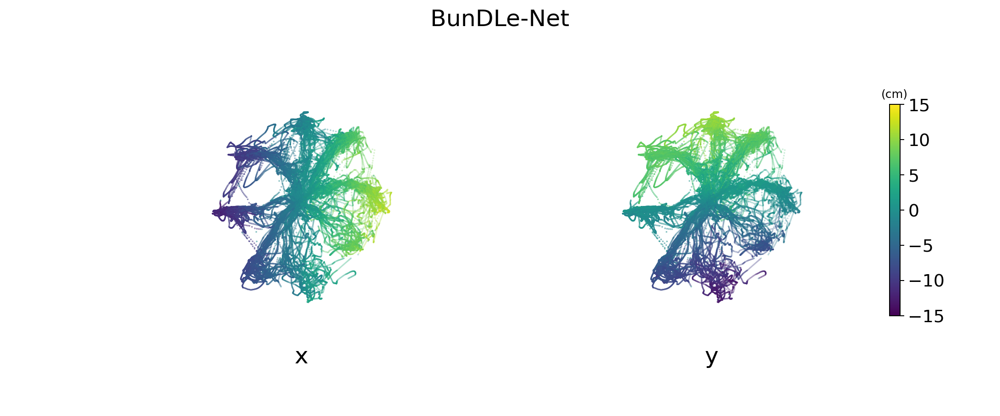

In [28]:
plot_embedding(Y0_, B_, title=titles[i], elev=elev[i], azim=azim[i])
plt.savefig('figures/monkey/color_map', transparent=True, bbox_inches="tight", dpi=300)
